In [2]:
import sklearn as sk
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn.datasets import fetch_olivetti_faces

In [3]:
faces = fetch_olivetti_faces()
faces.DESCR

'.. _olivetti_faces_dataset:\n\nThe Olivetti faces dataset\n--------------------------\n\n`This dataset contains a set of face images`_ taken between April 1992 and \nApril 1994 at AT&T Laboratories Cambridge. The\n:func:`sklearn.datasets.fetch_olivetti_faces` function is the data\nfetching / caching function that downloads the data\narchive from AT&T.\n\n.. _This dataset contains a set of face images: https://cam-orl.co.uk/facedatabase.html\n\nAs described on the original website:\n\n    There are ten different images of each of 40 distinct subjects. For some\n    subjects, the images were taken at different times, varying the lighting,\n    facial expressions (open / closed eyes, smiling / not smiling) and facial\n    details (glasses / no glasses). All the images were taken against a dark\n    homogeneous background with the subjects in an upright, frontal position \n    (with tolerance for some side movement).\n\n**Data Set Characteristics:**\n\n    =================   ============

In [106]:
# Image printing helper function
def print_faces(images, target, top_n):
    # set up figure size
    fig = plt.figure(figsize=(20,20))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0.05)
    for i in range(top_n):
        p = fig.add_subplot(20,20, i+1, xticks=[], yticks=[])
        p.imshow(images[i],plt.cm.bone)
        p.text(0,14,str(target[i]))
        p.text(0,60,str(i))

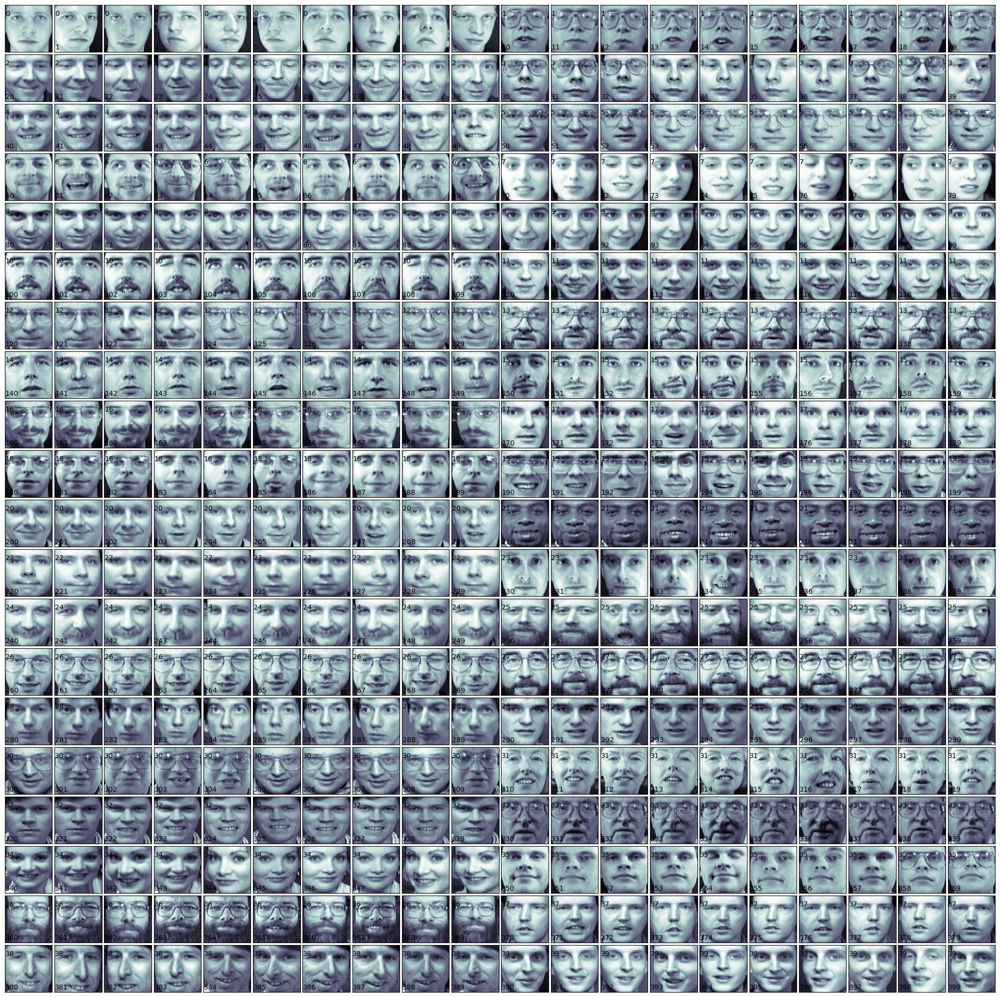

In [107]:
print_faces(faces.images,faces.target,400)

In [6]:
from sklearn.svm import SVC 
svc_1 = SVC(kernel='linear')

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(faces.data, faces.target, test_size=0.25, random_state=0)

In [8]:
from sklearn.model_selection import cross_val_score, KFold
from scipy.stats import sem

In [9]:
def evaluate_cross_validation(clf, X, y, K):
    # Create a k-fold cross validation iterator
    cv = KFold(K, shuffle=True, random_state=0)
    scores = cross_val_score(clf, X, y, cv=cv)
    print(np.mean(scores),sem(scores))

In [10]:
evaluate_cross_validation(svc_1, X_train, y_train,5)

0.9133333333333334 0.012247448713915886


In [20]:
from sklearn import metrics

def train_and_evaluate(clf, X_train, X_test, y_train, y_test):
    clf.fit(X_train, y_train)
    print('Accuracy of training set: ',clf.score(X_train, y_train))
    print('Accuracy of testing set: ', clf.score(X_test, y_test))
    y_pred = clf.predict(X_test)
    print("Classification Report:")
    print(metrics.classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(metrics.confusion_matrix(y_test, y_pred))
    return y_pred

In [57]:
yPred = train_and_evaluate(svc_1, X_train, X_test, y_train, y_test)

Accuracy of training set:  1.0
Accuracy of testing set:  0.99
Classification Report:
              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      1.00      1.00         4
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         4
           7       1.00      0.67      0.80         3
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         4
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         3
          17       1.00      1.00      1.00       

In [52]:
str(yPred[1])

'30'

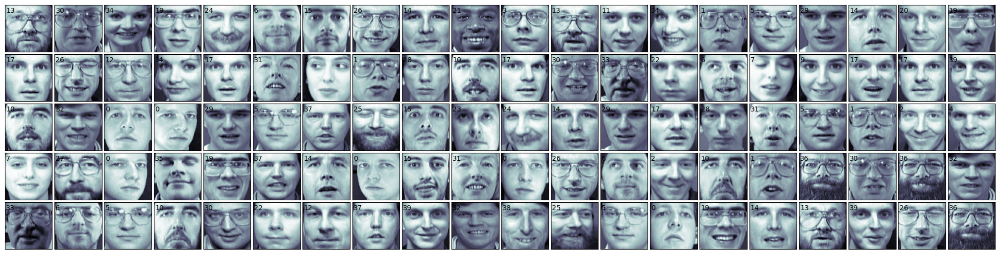

In [63]:
grid = plt.figure(figsize=(20,20))
grid.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0.05)
for i in range(X_test.shape[0]):
    p = grid.add_subplot(20,20, i+1, xticks=[], yticks=[])
    p.text(1,10,str(yPred[i]))
    p.imshow(np.reshape(X_test[i],[64,64]),plt.cm.bone)

## Classify faces as people with and without glasses

In [105]:
# Index ranges of images with glasses
glasses = [(10, 19), (30, 32), (37, 38), (50, 59), (63, 64),(69, 69), (120, 121), (124, 129), (130, 139), (160, 161),(164, 169), (180, 182), (185, 185), (189, 189), (190, 192),(194, 194), (196, 199), (260, 269), (270, 279), (300, 309),(330, 339), (358, 359), (360, 369)]


In [108]:
def create_target(segments):
    y = np.zeros(faces.target.shape[0])
    for (start,end) in segments:
        y[start:end+1] = 1
    return y

In [110]:
target_glasses = create_target(glasses)

In [113]:
X_Train_glasses, X_Test_glasses, y_Train_glasses, y_Test_glasses = train_test_split(faces.data, target_glasses, test_size=0.25)
# The target is now target_glasses, meaning that all images with glasses are marked as 1 in target. Our classification will occur on this criteria.
# Earlier, each image of a specific person was given a unique integer in target, now all the images with glasses are given integer 1.

In [114]:
glassClassifierSVC = SVC(kernel='linear')

In [115]:
glassClassifierSVC.fit(X_Train_glasses,y_Train_glasses)

SVC(kernel='linear')

In [116]:
yPredictedGlasses = glassClassifierSVC.predict(X_Test_glasses)

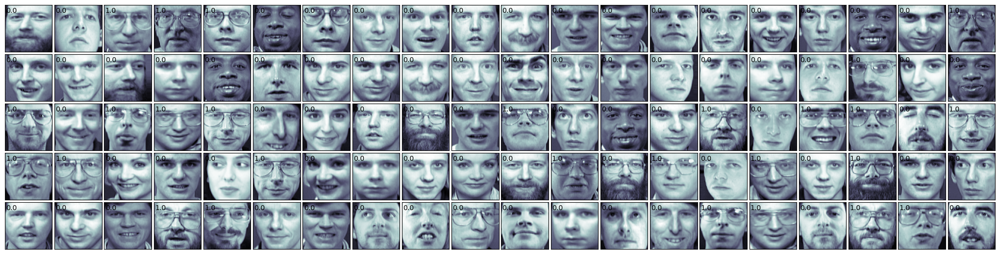

In [118]:
outGridGlasses = plt.figure(figsize=(20,20))
outGridGlasses.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0.05)
for i in range(X_Test_glasses.shape[0]):
    imgGlasses = outGridGlasses.add_subplot(20,20, i+1, xticks=[], yticks=[])
    imgGlasses.text(1,10,str(yPredictedGlasses[i]))
    imgGlasses.imshow(np.reshape(X_Test_glasses[i],[64,64]),plt.cm.bone)

In [120]:
glassClassifierSVC.score(X_Test_glasses,y_Test_glasses)

0.96

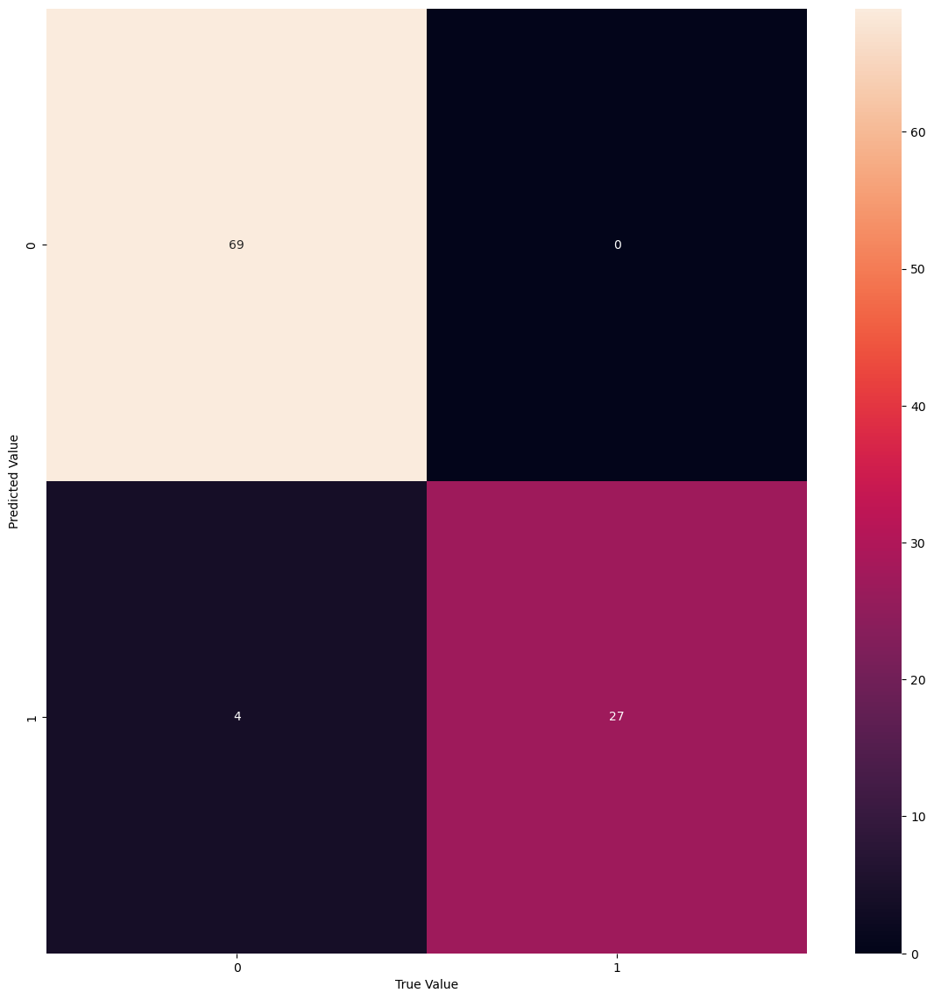

In [125]:
from sklearn import metrics
import seaborn as sns

confusionMat = metrics.confusion_matrix(y_Test_glasses,yPredictedGlasses)
hm = plt.figure(figsize=(14,14))
hm = sns.heatmap(confusionMat,annot=True)
plt.xlabel('True Value')
plt.ylabel('Predicted Value')
plt.show()